<a href="https://colab.research.google.com/github/czhangg17/articulo_trasplantes/blob/main/Arboles_articulo_Feb2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Modelo arboles de decision para articulo de trasplantes
REALIZANDO LOS ARBOLES PERO CON EN TIEMPO CATEGORIZADO

In [35]:
#!pip install pydotplus
#!pip install dtreeviz
#!pip install openpyxl==3.0

In [36]:
#librerias: La que realiza el arbol de desicion es la  tree de sklarn 
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (16, 9)
plt.style.use('ggplot')
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from IPython.display import Image as PImage
from subprocess import check_call
from PIL import Image, ImageDraw, ImageFont
from sklearn.model_selection import train_test_split, cross_val_score
import re

In [37]:
from sklearn.metrics import confusion_matrix, classification_report

In [38]:
# para las imagenes
from sklearn.tree import export_graphviz
#from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import pydot

# Importacion de datos


In [39]:
from google.colab import drive
PATH = '/content/drive/My Drive/Trabajo de Grado/Tabla_art.xlsx' 
drive.mount('/content/drive')
data=pd.read_excel(PATH, header=0)
del (data['Unnamed: 0'])
del (data['TIEMPO'])
del (data['CIUDAD'])
print(data.head(5))
#quitando el tiempo continuo 
#data=data.drop(['Unnamed: 0','TIEMPO','CIUDAD'],axis=1)
dummies=pd.get_dummies(data)
np.shape(dummies)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
      IPS_simu      RECIBE SEXO  ... HLA_DRB1_simu REGIONAL Tiempo_cat
0  ABOOD-SHAIO  CADAVERICO    M  ...         01_02    REG 1    > 4 año
1  ABOOD-SHAIO  CADAVERICO    F  ...         08_02    REG 1    > 4 año
2  ABOOD-SHAIO  CADAVERICO    M  ...         11_02    REG 1      1 año
3  ABOOD-SHAIO  CADAVERICO    M  ...         04_04    REG 1      1 año
4  ABOOD-SHAIO  CADAVERICO    M  ...         11_01    REG 1      4 año

[5 rows x 11 columns]


(3441, 263)

In [40]:
### TABLA DE 9 PREDICCIONES , LAS PONES AL FINAL PARA QUE PUEDAN QUEDAN COMO LAS DUMMIES Y LAS QUITAMOS
predicciones=pd.read_excel('/content/drive/My Drive/Trabajo de Grado/PREDICCIONES.xlsx', header=0)
data_pred=data.append(predicciones)
del (data_pred['RECIBE'])
dummies_predicciones=pd.get_dummies(data_pred).tail(9)
print(dummies_predicciones)

   IPS_simu_ABOOD-SHAIO  ...  Tiempo_cat_> 4 año
0                     0  ...                   1
1                     0  ...                   0
2                     0  ...                   1
3                     0  ...                   0
4                     0  ...                   0
5                     0  ...                   1
6                     0  ...                   0
7                     0  ...                   0
8                     0  ...                   0

[9 rows x 259 columns]


# Resumen descriptivo de los datos

# Arbol completo 
* recall = sensibilidad ( tasa positiva real )- suma por columnas
* precision = Accuracy de cada categoria -suma por filas
* f1-score = 2* (precision * recall)/(precision + recall)


In [41]:
variables_x=list(dummies)
variables_y=variables_x[22:26]
del variables_x[22:26]
print(variables_y)

['RECIBE_CADAVERICO', 'RECIBE_MUERE', 'RECIBE_NO MUERE', 'RECIBE_VIVO']


In [42]:
feature_cols=variables_x
Y=data['RECIBE']
X=dummies[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1) # 70% training and 30% test
clf = DecisionTreeClassifier(criterion='entropy')
# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

[[140   4  21  27]
 [  1   0  35   0]
 [ 31  26 696   8]
 [ 25   1   8  10]]
              precision    recall  f1-score   support

  CADAVERICO       0.71      0.73      0.72       192
       MUERE       0.00      0.00      0.00        36
    NO MUERE       0.92      0.91      0.92       761
        VIVO       0.22      0.23      0.22        44

    accuracy                           0.82      1033
   macro avg       0.46      0.47      0.46      1033
weighted avg       0.82      0.82      0.82      1033

Accuracy: 0.818973862536302


In [43]:
from graphviz import Source
graph = Source( tree.export_graphviz(clf, out_file=None, feature_names=X.columns, filled=True,class_names=clf.classes_ ))
png_bytes = graph.pipe(format='png')
with open('Arbol_completo_art.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

In [44]:
#### validacion cruzada para la precision del modelo
cross_val=cross_val_score(clf,X_train,y_train, cv=5)
print('Cross-validation (accuracy)', cross_val)
                                                   
print('Promedio cross-validation score (5-fold): {:.3f}'.format(np.mean(cross_val)))

Cross-validation (accuracy) [0.81327801 0.79460581 0.79875519 0.7962578  0.78794179]
Promedio cross-validation score (5-fold): 0.798


#optimizando el arbol

In [45]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion='entropy',
                                            min_samples_split=10,
                                            min_samples_leaf=10,
                                            max_depth = 6)
# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)
acc_opt=metrics.accuracy_score(y_test,y_pred)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print("Accuracy:",str('{:4.2f}'.format(acc_opt*100))+'%')

[[153   0  34   5]
 [  0   0  36   0]
 [  5   0 756   0]
 [ 29   0  15   0]]
              precision    recall  f1-score   support

  CADAVERICO       0.82      0.80      0.81       192
       MUERE       0.00      0.00      0.00        36
    NO MUERE       0.90      0.99      0.94       761
        VIVO       0.00      0.00      0.00        44

    accuracy                           0.88      1033
   macro avg       0.43      0.45      0.44      1033
weighted avg       0.81      0.88      0.85      1033

Accuracy: 88.00%


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


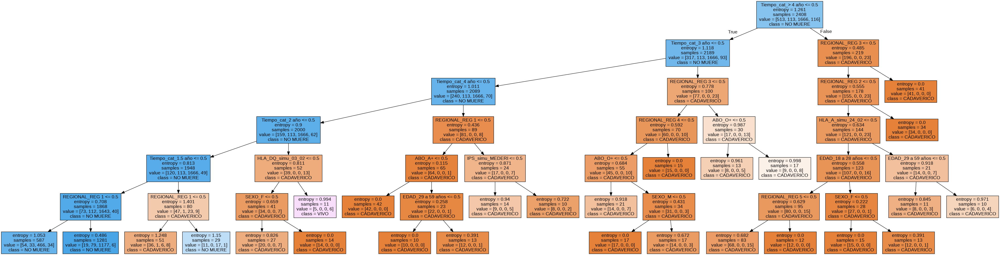

In [46]:
graph = Source( tree.export_graphviz(clf, out_file=None, feature_names=X.columns, filled=True,class_names=clf.classes_ ))
png_bytes = graph.pipe(format='png')
with open('Arbol_completo_art_optimizado.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

In [47]:
#### validacion cruzada para la precision del modelo
cross_val=cross_val_score(clf,X_train,y_train, cv=5)
print('Cross-validation (accuracy)', cross_val)
                                                   
print('Promedio cross-validation score (5-fold): {:.3f}'.format(np.mean(cross_val)))

Cross-validation (accuracy) [0.87551867 0.86307054 0.87551867 0.85654886 0.84823285]
Promedio cross-validation score (5-fold): 0.864


In [48]:
predicciones=clf.predict(dummies_predicciones)
print(predicciones)
predict_proba=clf.predict_proba(dummies_predicciones)
print(predict_proba)


['CADAVERICO' 'NO MUERE' 'CADAVERICO' 'NO MUERE' 'NO MUERE' 'CADAVERICO'
 'CADAVERICO' 'NO MUERE' 'CADAVERICO']
[[0.6        0.         0.         0.4       ]
 [0.01483216 0.06167057 0.91881343 0.00468384]
 [1.         0.         0.         0.        ]
 [0.09199319 0.05621806 0.79386712 0.05792164]
 [0.09199319 0.05621806 0.79386712 0.05792164]
 [1.         0.         0.         0.        ]
 [1.         0.         0.         0.        ]
 [0.09199319 0.05621806 0.79386712 0.05792164]
 [0.74074074 0.         0.         0.25925926]]


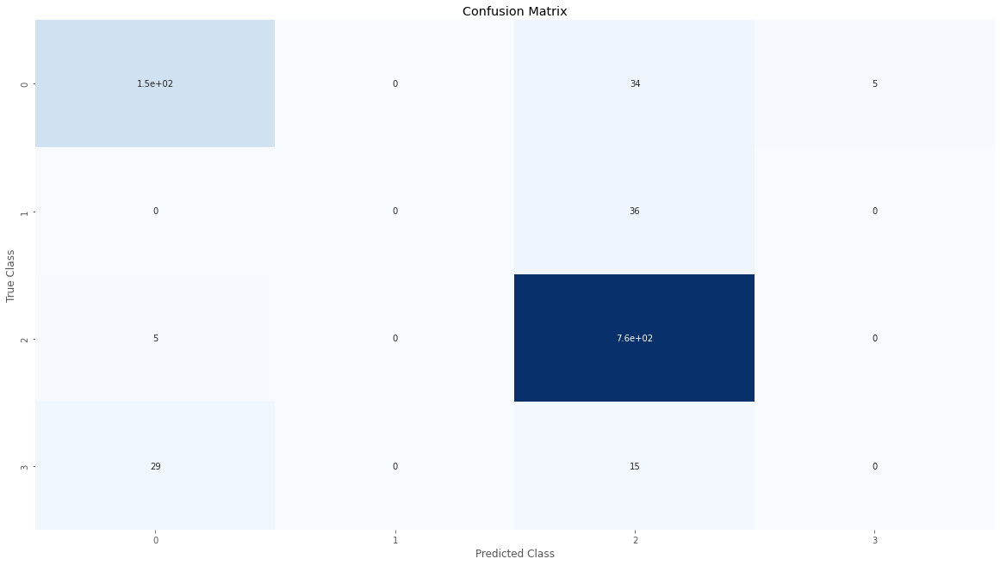

In [49]:
mat=confusion_matrix(y_test,y_pred)
sb.heatmap(mat, annot=True, cbar=None, cmap="Blues")
plt.title("Confusion Matrix"), plt.tight_layout()
plt.ylabel("True Class"), plt.xlabel("Predicted Class")
plt.show()

# Arboles por regionales

### Regional 1 - Bogotá

In [16]:
data1=data[data['REGIONAL']=='REG 1']
del (data1['REGIONAL'])
dummies1=pd.get_dummies(data1)
lista=list(dummies1)
print(lista)
variables_x=list(dummies1)
variables_y=variables_x[10:14]
del variables_x[10:14]
print('target:',variables_y)

['IPS_simu_ABOOD-SHAIO', 'IPS_simu_CARDIOINFANTIL', 'IPS_simu_COLSANITAS', 'IPS_simu_COUNTRY', 'IPS_simu_MEDERI', 'IPS_simu_PROCARDIO', 'IPS_simu_REINA-SOFIA', 'IPS_simu_SAN-IGNACIO', 'IPS_simu_SANTA-FE', 'IPS_simu_SOC.CIRUGIA', 'RECIBE_CADAVERICO', 'RECIBE_MUERE', 'RECIBE_NO MUERE', 'RECIBE_VIVO', 'SEXO_F', 'SEXO_M', 'EDAD_1 a 5 años', 'EDAD_12 a 17 años', 'EDAD_18 a 28 años', 'EDAD_29 a 59 años', 'EDAD_6 a 11 años', 'EDAD_mayores de 60', 'ABO_A+', 'ABO_A-', 'ABO_AB+', 'ABO_AB-', 'ABO_B+', 'ABO_B-', 'ABO_O+', 'ABO_O-', 'ABO_sin dato', 'HLA_A_simu_01_01', 'HLA_A_simu_01_02', 'HLA_A_simu_02_01', 'HLA_A_simu_02_02', 'HLA_A_simu_02_04', 'HLA_A_simu_02_05', 'HLA_A_simu_02_11', 'HLA_A_simu_02_13', 'HLA_A_simu_02_17', 'HLA_A_simu_02_22', 'HLA_A_simu_03_01', 'HLA_A_simu_03_02', 'HLA_A_simu_11_01', 'HLA_A_simu_23_01', 'HLA_A_simu_24_02', 'HLA_A_simu_24_03', 'HLA_A_simu_24_14', 'HLA_A_simu_24_142', 'HLA_A_simu_24_15', 'HLA_A_simu_25_01', 'HLA_A_simu_26_01', 'HLA_A_simu_26_17', 'HLA_A_simu_29_01

In [17]:
feature_cols=variables_x
Y=data1['RECIBE']
X=dummies1[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1) # 70% training and 30% test
clf1 = DecisionTreeClassifier(criterion='entropy',
                                            min_samples_split=13,
                                            min_samples_leaf=13,
                                            max_depth = 7)
# Train Decision Tree Classifer
clf1 = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf1.predict(X_test)
acc_reg_1=metrics.accuracy_score(y_test, y_pred)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print("Accuracy:",str('{:4.2f}'.format(acc_reg_1*100))+'%')


[[ 61   0  16   0]
 [  0   0  28   0]
 [  3   0 524   0]
 [ 10   0   2   0]]
              precision    recall  f1-score   support

  CADAVERICO       0.82      0.79      0.81        77
       MUERE       0.00      0.00      0.00        28
    NO MUERE       0.92      0.99      0.96       527
        VIVO       0.00      0.00      0.00        12

    accuracy                           0.91       644
   macro avg       0.44      0.45      0.44       644
weighted avg       0.85      0.91      0.88       644

Accuracy: 90.84%


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [18]:
#### validacion cruzada para la precision del modelo
cross_val=cross_val_score(clf1,X_train,y_train, cv=5)
print('Cross-validation (accuracy)', cross_val)
                                                   
print('Promedio cross-validation score (5-fold): {:.3f}'.format(np.mean(cross_val)))

Cross-validation (accuracy) [0.89700997 0.89666667 0.9        0.9        0.89666667]
Promedio cross-validation score (5-fold): 0.898


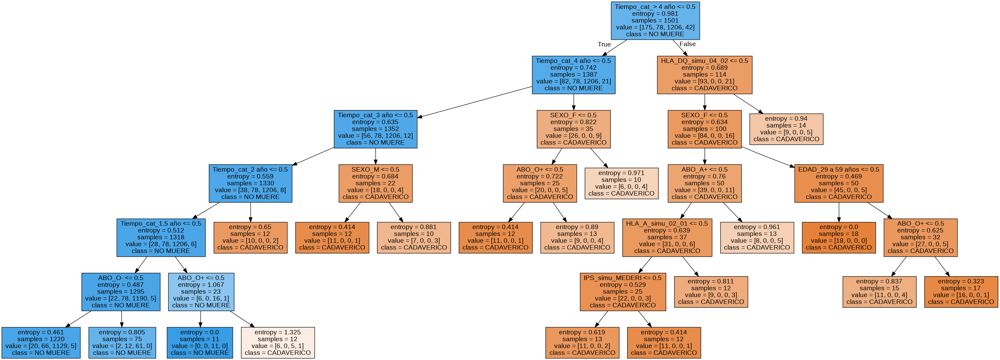

In [19]:
graph = Source( tree.export_graphviz(clf1, out_file=None, feature_names=X.columns, filled=True,class_names=clf1.classes_ ))
png_bytes = graph.pipe(format='png')
with open('Arbol_reg1_art.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

### Regional 2 -

In [20]:
data2=data[data['REGIONAL']=='REG 2']
del (data2['REGIONAL'])
dummies2=pd.get_dummies(data2)
lista=list(dummies2)
print(lista)
variables_x=list(dummies2)
variables_y=variables_x[4:8]
del variables_x[4:8]
print('target:',variables_y)

['IPS_simu_IPS-ANTIOQUIA', 'IPS_simu_P.B.URIBE', 'IPS_simu_PAUL', 'IPS_simu_PAUL-RIONEGRO', 'RECIBE_CADAVERICO', 'RECIBE_MUERE', 'RECIBE_NO MUERE', 'RECIBE_VIVO', 'SEXO_F', 'SEXO_M', 'EDAD_1 a 5 años', 'EDAD_12 a 17 años', 'EDAD_18 a 28 años', 'EDAD_29 a 59 años', 'EDAD_6 a 11 años', 'EDAD_mayores de 60', 'ABO_A+', 'ABO_A-', 'ABO_AB+', 'ABO_B+', 'ABO_B-', 'ABO_O+', 'ABO_O-', 'ABO_sin dato', 'HLA_A_simu_01_01', 'HLA_A_simu_01_02', 'HLA_A_simu_02_01', 'HLA_A_simu_02_02', 'HLA_A_simu_02_04', 'HLA_A_simu_02_05', 'HLA_A_simu_02_06', 'HLA_A_simu_02_11', 'HLA_A_simu_02_13', 'HLA_A_simu_02_17', 'HLA_A_simu_02_22', 'HLA_A_simu_03_01', 'HLA_A_simu_03_02', 'HLA_A_simu_11_01', 'HLA_A_simu_23_01', 'HLA_A_simu_24_02', 'HLA_A_simu_24_03', 'HLA_A_simu_24_14', 'HLA_A_simu_25_01', 'HLA_A_simu_26_01', 'HLA_A_simu_26_17', 'HLA_A_simu_29_01', 'HLA_A_simu_29_02', 'HLA_A_simu_30_01', 'HLA_A_simu_30_02', 'HLA_A_simu_30_04', 'HLA_A_simu_31_01', 'HLA_A_simu_32_01', 'HLA_A_simu_33_01', 'HLA_A_simu_33_03', 'HLA_A

In [21]:
feature_cols=variables_x
Y=data2['RECIBE']
X=dummies2[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1) # 70% training and 30% test
clf2 = DecisionTreeClassifier(criterion='entropy',
                                            min_samples_split=13,
                                            min_samples_leaf=13,
                                            max_depth = 7)
# Train Decision Tree Classifer
clf2 = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf2.predict(X_test)
acc_reg_2=metrics.accuracy_score(y_test, y_pred)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print("Accuracy:",str('{:4.2f}'.format(acc_reg_2*100))+'%')


[[44  0  9  0]
 [ 1  0  5  0]
 [ 8  0 62  0]
 [ 4  0  6  0]]
              precision    recall  f1-score   support

  CADAVERICO       0.77      0.83      0.80        53
       MUERE       0.00      0.00      0.00         6
    NO MUERE       0.76      0.89      0.82        70
        VIVO       0.00      0.00      0.00        10

    accuracy                           0.76       139
   macro avg       0.38      0.43      0.40       139
weighted avg       0.68      0.76      0.72       139

Accuracy: 76.26%


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [22]:
#### validacion cruzada para la precision del modelo
cross_val=cross_val_score(clf2,X_train,y_train, cv=5)
print('Cross-validation (accuracy)', cross_val)
                                                   
print('Promedio cross-validation score (5-fold): {:.3f}'.format(np.mean(cross_val)))

Cross-validation (accuracy) [0.76923077 0.81538462 0.83076923 0.84375    0.71875   ]
Promedio cross-validation score (5-fold): 0.796


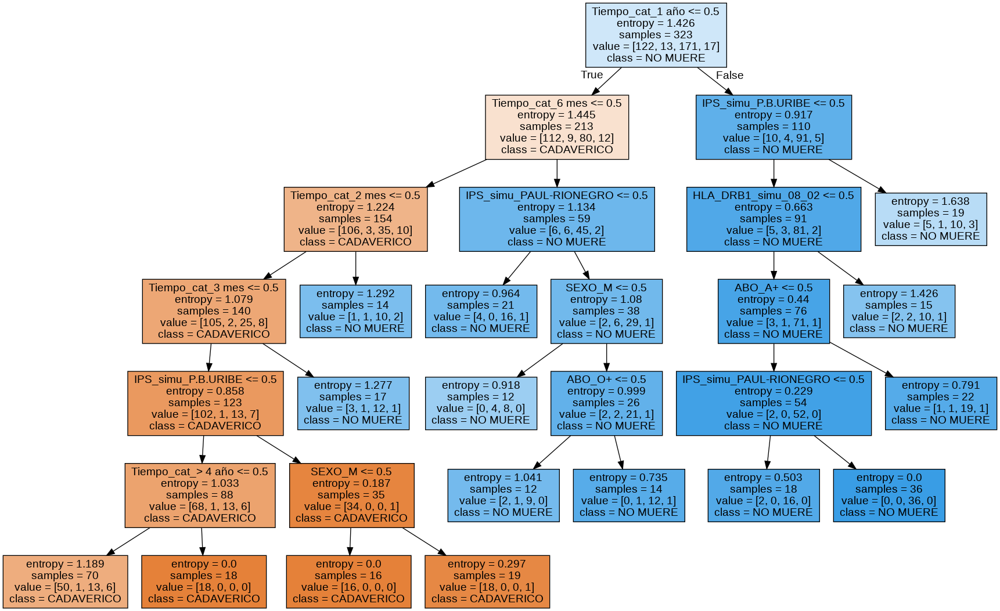

In [23]:
graph = Source( tree.export_graphviz(clf2, out_file=None, feature_names=X.columns, filled=True,class_names=clf1.classes_ ))
png_bytes = graph.pipe(format='png')
with open('Arbol_reg2_art.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

### Regional 3

In [24]:
data3=data[data['REGIONAL']=='REG 3']
del (data3['REGIONAL'])
dummies3=pd.get_dummies(data3)
lista=list(dummies3)
print(lista)
variables_x=list(dummies3)
variables_y=variables_x[2:6]
del variables_x[2:6]
print('target:',variables_y)

['IPS_simu_IMBANACO', 'IPS_simu_VALLE-DE-LILI', 'RECIBE_CADAVERICO', 'RECIBE_MUERE', 'RECIBE_NO MUERE', 'RECIBE_VIVO', 'SEXO_F', 'SEXO_M', 'EDAD_12 a 17 años', 'EDAD_18 a 28 años', 'EDAD_29 a 59 años', 'EDAD_6 a 11 años', 'EDAD_mayores de 60', 'ABO_A+', 'ABO_A-', 'ABO_AB+', 'ABO_AB-', 'ABO_B+', 'ABO_B-', 'ABO_O+', 'ABO_O-', 'ABO_sin dato', 'HLA_A_simu_01_01', 'HLA_A_simu_01_02', 'HLA_A_simu_02_01', 'HLA_A_simu_02_02', 'HLA_A_simu_02_05', 'HLA_A_simu_02_11', 'HLA_A_simu_02_13', 'HLA_A_simu_02_17', 'HLA_A_simu_02_22', 'HLA_A_simu_03_01', 'HLA_A_simu_03_02', 'HLA_A_simu_11_01', 'HLA_A_simu_23_01', 'HLA_A_simu_24_02', 'HLA_A_simu_24_03', 'HLA_A_simu_24_14', 'HLA_A_simu_24_53', 'HLA_A_simu_24_95', 'HLA_A_simu_25_01', 'HLA_A_simu_26_01', 'HLA_A_simu_29_01', 'HLA_A_simu_29_02', 'HLA_A_simu_30_01', 'HLA_A_simu_30_02', 'HLA_A_simu_31_01', 'HLA_A_simu_31_15', 'HLA_A_simu_32_01', 'HLA_A_simu_33_01', 'HLA_A_simu_33_03', 'HLA_A_simu_34_02', 'HLA_A_simu_66_01', 'HLA_A_simu_68_01', 'HLA_A_simu_68_02'

In [25]:
feature_cols=variables_x
Y=data3['RECIBE']
X=dummies3[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=1) # 70% training and 30% test
clf3 = DecisionTreeClassifier(criterion='entropy')
# Train Decision Tree Classifer
clf3 = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf3.predict(X_test)
acc_reg_3=metrics.accuracy_score(y_test, y_pred)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print("Accuracy:",str('{:4.2f}'.format(acc_reg_3*100))+'%')

[[15  0  4  7]
 [ 0  0  3  0]
 [ 1  0 50  0]
 [ 7  0  5  1]]
              precision    recall  f1-score   support

  CADAVERICO       0.65      0.58      0.61        26
       MUERE       0.00      0.00      0.00         3
    NO MUERE       0.81      0.98      0.88        51
        VIVO       0.12      0.08      0.10        13

    accuracy                           0.71        93
   macro avg       0.40      0.41      0.40        93
weighted avg       0.64      0.71      0.67        93

Accuracy: 70.97%


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [26]:
#### validacion cruzada para la precision del modelo
cross_val=cross_val_score(clf3,X_train,y_train, cv=5)
print('Cross-validation (accuracy)', cross_val)
                                                   
print('Promedio cross-validation score (5-fold): {:.3f}'.format(np.mean(cross_val)))

Cross-validation (accuracy) [0.85135135 0.85135135 0.7972973  0.82432432 0.84931507]
Promedio cross-validation score (5-fold): 0.835


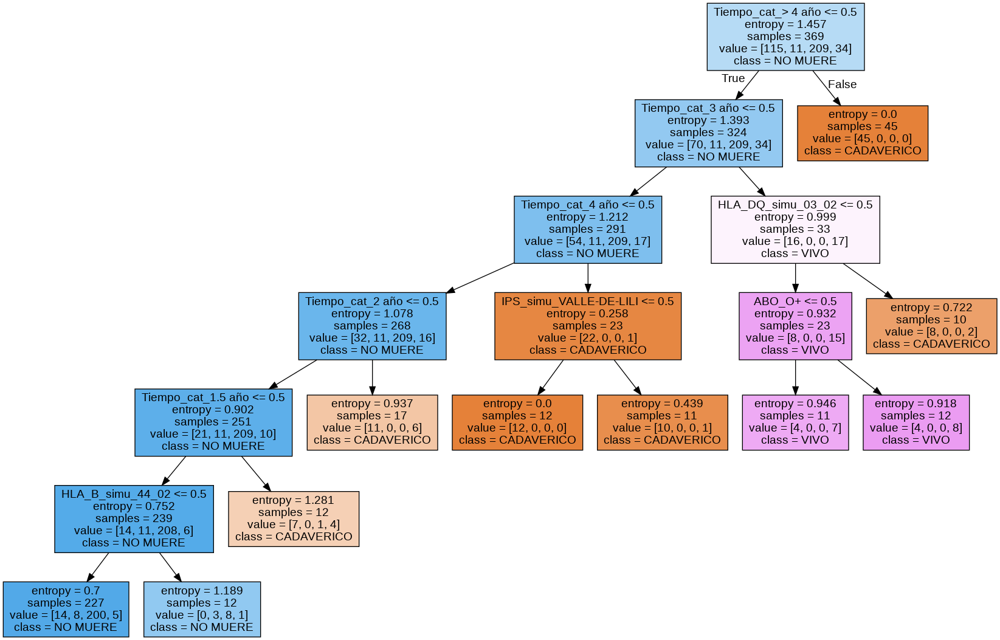

In [27]:
graph = Source( tree.export_graphviz(clf3, out_file=None, feature_names=X.columns, filled=True,class_names=clf1.classes_ ))
png_bytes = graph.pipe(format='png')
with open('Arbol_reg3_art.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

### Regional 4

In [28]:
data4=data[data['REGIONAL']=='REG 4']
del (data4['REGIONAL'])
dummies4=pd.get_dummies(data4)
lista=list(dummies4)
print(lista)
variables_x=list(dummies4)
variables_y=variables_x[2:5]
del variables_x[2:5]
print('target:',variables_y)

['IPS_simu_F.CARDIOVASCULAR', 'IPS_simu_FOSCAL', 'RECIBE_CADAVERICO', 'RECIBE_NO MUERE', 'RECIBE_VIVO', 'SEXO_F', 'SEXO_M', 'EDAD_1 a 5 años', 'EDAD_12 a 17 años', 'EDAD_18 a 28 años', 'EDAD_29 a 59 años', 'EDAD_6 a 11 años', 'EDAD_mayores de 60', 'ABO_A+', 'ABO_AB-', 'ABO_B+', 'ABO_B-', 'ABO_O+', 'ABO_O-', 'ABO_sin dato', 'HLA_A_simu_01_01', 'HLA_A_simu_02_01', 'HLA_A_simu_02_02', 'HLA_A_simu_02_05', 'HLA_A_simu_02_13', 'HLA_A_simu_02_22', 'HLA_A_simu_03_01', 'HLA_A_simu_03_02', 'HLA_A_simu_11_01', 'HLA_A_simu_23_01', 'HLA_A_simu_24_02', 'HLA_A_simu_26_01', 'HLA_A_simu_29_02', 'HLA_A_simu_30_01', 'HLA_A_simu_30_02', 'HLA_A_simu_31_01', 'HLA_A_simu_32_01', 'HLA_A_simu_33_03', 'HLA_A_simu_68_01', 'HLA_A_simu_68_02', 'HLA_A_simu_69_01', 'HLA_A_simu_74_01', 'HLA_B_simu_07_02', 'HLA_B_simu_08_01', 'HLA_B_simu_13_02', 'HLA_B_simu_14_01', 'HLA_B_simu_14_02', 'HLA_B_simu_15_05', 'HLA_B_simu_18_01', 'HLA_B_simu_27_05', 'HLA_B_simu_35_01', 'HLA_B_simu_35_02', 'HLA_B_simu_35_03', 'HLA_B_simu_35_

[[16  0  0]
 [ 2  4  0]
 [ 0  0  2]]
              precision    recall  f1-score   support

  CADAVERICO       0.89      1.00      0.94        16
    NO MUERE       1.00      0.67      0.80         6
        VIVO       1.00      1.00      1.00         2

    accuracy                           0.92        24
   macro avg       0.96      0.89      0.91        24
weighted avg       0.93      0.92      0.91        24

Accuracy: 91.67%


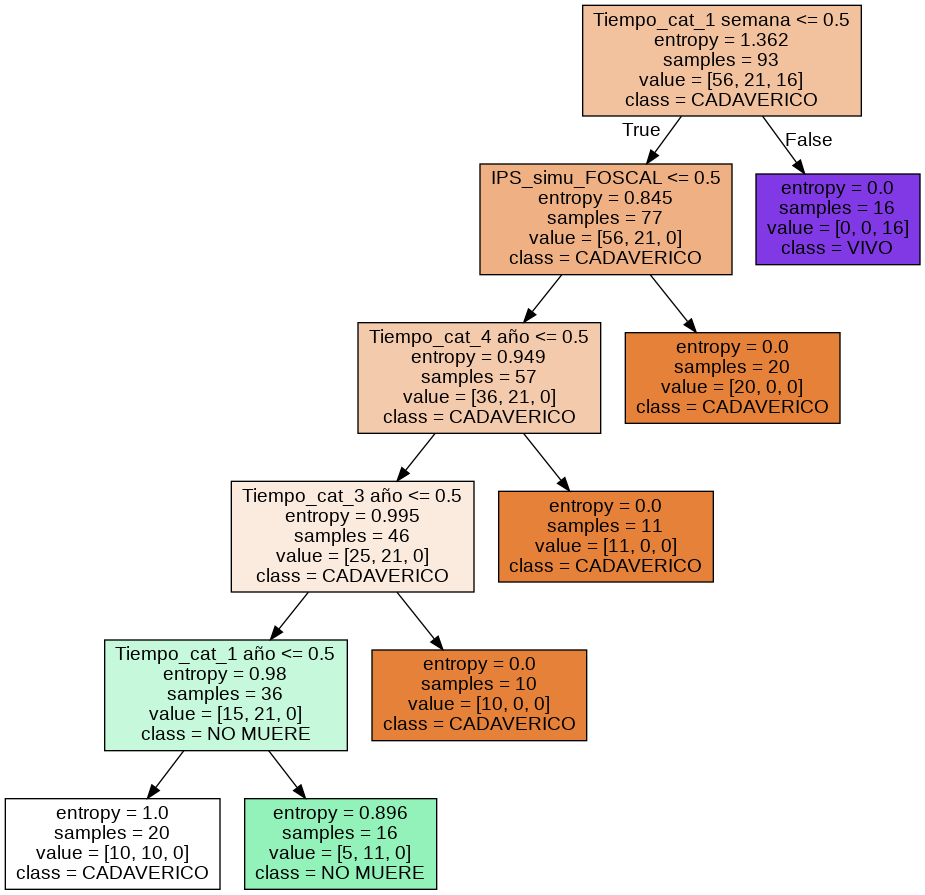

In [29]:
feature_cols=variables_x
Y=data4['RECIBE']
X=dummies4[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=1) # 70% training and 30% test
clf4 = DecisionTreeClassifier(criterion='entropy')
# Train Decision Tree Classifer
clf4 = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf4.predict(X_test)
acc_reg_4=metrics.accuracy_score(y_test, y_pred)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print("Accuracy:",str('{:4.2f}'.format(acc_reg_4*100))+'%')
##### graficas
graph = Source( tree.export_graphviz(clf4, out_file=None, feature_names=X.columns, filled=True,class_names=clf1.classes_ ))
png_bytes = graph.pipe(format='png')
with open('Arbol_reg4_art.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

### Regional 5

In [30]:
data5=data[data['REGIONAL']=='REG 5']
del (data5['REGIONAL'])
dummies5=pd.get_dummies(data5)
lista=list(dummies5)
print(lista)
variables_x=list(dummies5)
variables_y=variables_x[2:6]
del variables_x[2:6]
print('target:',variables_y)

['IPS_simu_C.ASUNCION', 'IPS_simu_LA-COSTA', 'RECIBE_CADAVERICO', 'RECIBE_MUERE', 'RECIBE_NO MUERE', 'RECIBE_VIVO', 'SEXO_F', 'SEXO_M', 'EDAD_1 a 5 años', 'EDAD_12 a 17 años', 'EDAD_18 a 28 años', 'EDAD_29 a 59 años', 'EDAD_6 a 11 años', 'EDAD_mayores de 60', 'ABO_A+', 'ABO_A-', 'ABO_AB+', 'ABO_AB-', 'ABO_B+', 'ABO_B-', 'ABO_O+', 'ABO_O-', 'ABO_sin dato', 'HLA_A_simu_01_01', 'HLA_A_simu_02_01', 'HLA_A_simu_02_02', 'HLA_A_simu_02_05', 'HLA_A_simu_02_06', 'HLA_A_simu_02_11', 'HLA_A_simu_02_13', 'HLA_A_simu_02_17', 'HLA_A_simu_02_22', 'HLA_A_simu_03_01', 'HLA_A_simu_03_02', 'HLA_A_simu_11_01', 'HLA_A_simu_23_01', 'HLA_A_simu_24_02', 'HLA_A_simu_24_03', 'HLA_A_simu_24_14', 'HLA_A_simu_25_01', 'HLA_A_simu_26_01', 'HLA_A_simu_29_01', 'HLA_A_simu_29_02', 'HLA_A_simu_30_01', 'HLA_A_simu_30_02', 'HLA_A_simu_31_01', 'HLA_A_simu_31_02', 'HLA_A_simu_32_01', 'HLA_A_simu_33_01', 'HLA_A_simu_33_03', 'HLA_A_simu_34_02', 'HLA_A_simu_66_01', 'HLA_A_simu_66_02', 'HLA_A_simu_68_01', 'HLA_A_simu_68_02', 'H

[[ 3  0  3  0]
 [ 0  0  2  0]
 [ 2  0 34  0]
 [ 1  0  1  0]]
              precision    recall  f1-score   support

  CADAVERICO       0.50      0.50      0.50         6
       MUERE       0.00      0.00      0.00         2
    NO MUERE       0.85      0.94      0.89        36
        VIVO       0.00      0.00      0.00         2

    accuracy                           0.80        46
   macro avg       0.34      0.36      0.35        46
weighted avg       0.73      0.80      0.77        46

Accuracy: 80.43%


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


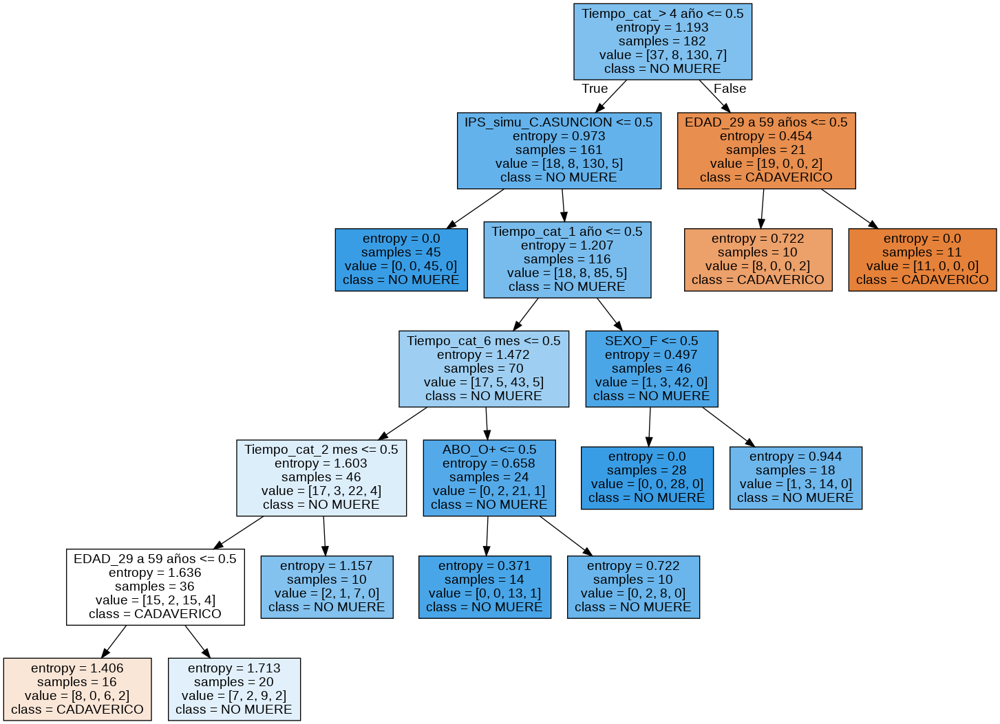

In [31]:
feature_cols=variables_x
Y=data5['RECIBE']
X=dummies5[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=1) # 70% training and 30% test
clf5 = DecisionTreeClassifier(criterion='entropy')
# Train Decision Tree Classifer
clf5 = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf5.predict(X_test)
acc_reg_5=metrics.accuracy_score(y_test, y_pred)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print("Accuracy:",str('{:4.2f}'.format(acc_reg_5*100))+'%')
##### graficas
graph = Source( tree.export_graphviz(clf5, out_file=None, feature_names=X.columns, filled=True,class_names=clf1.classes_ ))
png_bytes = graph.pipe(format='png')
with open('Arbol_reg5_art.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

### Regional 6

In [32]:
data6=data[data['REGIONAL']=='REG 6']
del (data6['REGIONAL'])
dummies6=pd.get_dummies(data6)
lista=list(dummies6)
print(lista)
variables_x=list(dummies6)
variables_y=variables_x[2:4]
del variables_x[2:4]
print('target:',variables_y)

['IPS_simu_AVIDANTI', 'IPS_simu_ESE', 'RECIBE_CADAVERICO', 'RECIBE_VIVO', 'SEXO_F', 'SEXO_M', 'EDAD_1 a 5 años', 'EDAD_12 a 17 años', 'EDAD_18 a 28 años', 'EDAD_29 a 59 años', 'EDAD_mayores de 60', 'ABO_A+', 'ABO_O+', 'ABO_O-', 'ABO_sin dato', 'HLA_A_simu_01_01', 'HLA_A_simu_02_01', 'HLA_A_simu_02_05', 'HLA_A_simu_02_13', 'HLA_A_simu_03_01', 'HLA_A_simu_03_02', 'HLA_A_simu_11_01', 'HLA_A_simu_24_02', 'HLA_A_simu_24_03', 'HLA_A_simu_30_01', 'HLA_A_simu_30_02', 'HLA_A_simu_31_01', 'HLA_A_simu_32_01', 'HLA_A_simu_33_01', 'HLA_A_simu_68_01', 'HLA_A_simu_74_01', 'HLA_B_simu_14_02', 'HLA_B_simu_15_01', 'HLA_B_simu_15_03', 'HLA_B_simu_18_01', 'HLA_B_simu_35_01', 'HLA_B_simu_35_12', 'HLA_B_simu_35_31', 'HLA_B_simu_35_43', 'HLA_B_simu_39_05', 'HLA_B_simu_39_10', 'HLA_B_simu_40_02', 'HLA_B_simu_41_02', 'HLA_B_simu_44_02', 'HLA_B_simu_51_01', 'HLA_B_simu_52_01', 'HLA_B_simu_55_01', 'HLA_B_simu_57_01', 'HLA_DQ_simu_03_01', 'HLA_DQ_simu_03_02', 'HLA_DQ_simu_05_01', 'HLA_DQ_simu_06_01', 'HLA_DQ_simu

[[4 0]
 [2 0]]
              precision    recall  f1-score   support

  CADAVERICO       0.67      1.00      0.80         4
        VIVO       0.00      0.00      0.00         2

    accuracy                           0.67         6
   macro avg       0.33      0.50      0.40         6
weighted avg       0.44      0.67      0.53         6

Accuracy: 66.67%


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


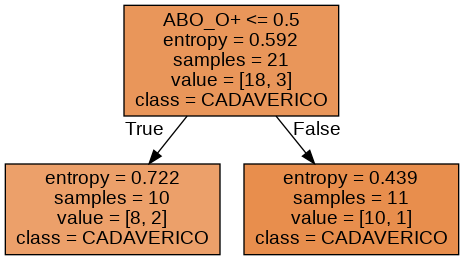

In [33]:
feature_cols=variables_x
Y=data6['RECIBE']
X=dummies6[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=1) # 70% training and 30% test
clf6 = DecisionTreeClassifier(criterion='entropy')
# Train Decision Tree Classifer
clf6 = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf6.predict(X_test)
acc_reg_6=metrics.accuracy_score(y_test, y_pred)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print("Accuracy:",str('{:4.2f}'.format(acc_reg_6*100))+'%')
##### graficas
graph = Source( tree.export_graphviz(clf6, out_file=None, feature_names=X.columns, filled=True,class_names=clf1.classes_ ))
png_bytes = graph.pipe(format='png')
with open('Arbol_reg6_art.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

 # Ejemplos de prediccion

- Ejemplos de predicción
- Paciente A-mucho tiempo (más de 4 años)-HLA
- Paciente A-mucho tiempo (más de 4 años)-DQ
- paciente A-poco tiempo (menos 6 meses)
- paciente O-mucho tiempo
- paciente O-poco tiempo


# Remuestreo bootstrap para la proporcion 